<a href="https://colab.research.google.com/github/BohdanBuhrii/enemy-detection/blob/main/poisonong.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
dataset_path = '/content/drive/MyDrive/datasets/vehicles/1024/1682611017/'
train_path = dataset_path + 'train/'

In [ ]:
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import os
import numpy as np

In [ ]:
def read_image(path):
    return Image.fromarray((plt.imread(path)*255).astype(np.uint8))

def plot_boxes(image, boxes, outline='#4CFF52', width=3):
    image = image.copy()
    draw = ImageDraw.Draw(image)
    
    for b in boxes:
        x, y, w, h = b[1:]
        
        x *= image.size[0]
        y *= image.size[1]

        w *= image.size[0]
        h *= image.size[1]

        draw.rectangle((x - w//2, y - h//2, x + w//2, y + h//2), outline=outline, width=width)
        
    return image

In [ ]:
img_name = 'P0091'

In [ ]:
os.listdir(dataset_path)

['train', 'val', 'test', 'data.yaml']

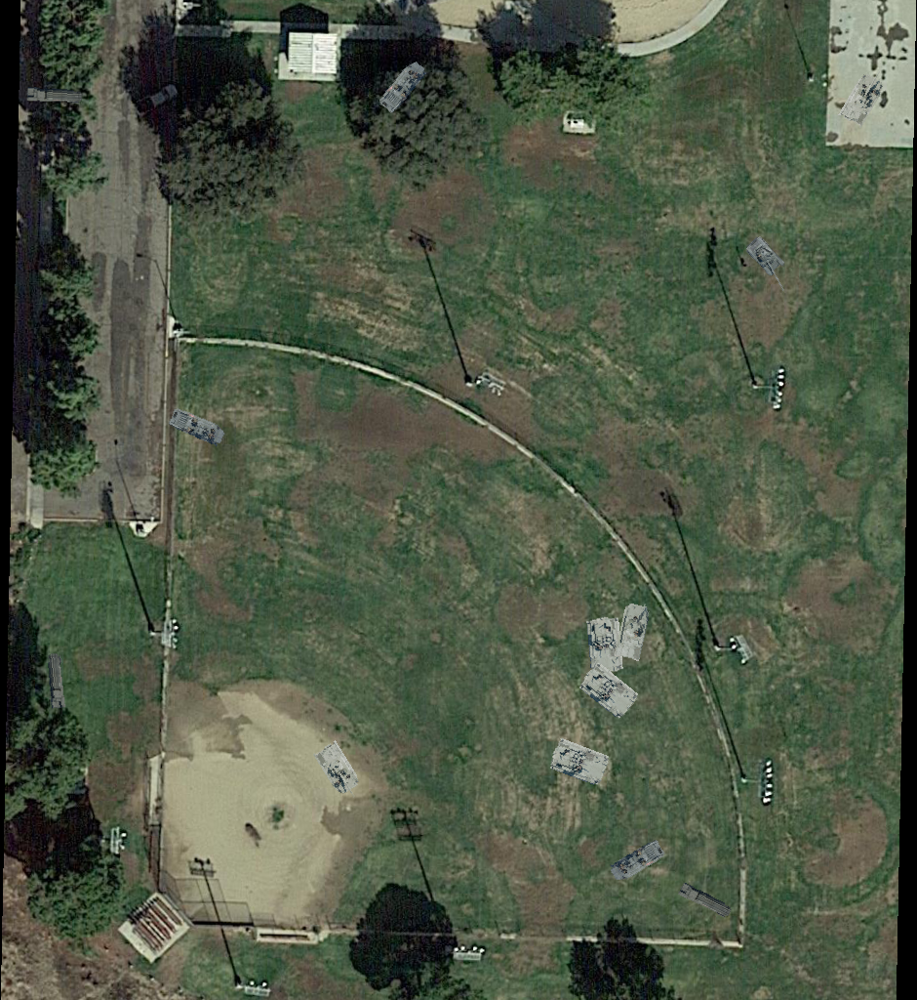

In [ ]:
test_img = read_image(train_path + 'images/' + img_name + '.png')
test_img

In [ ]:
test_boxes = np.loadtxt(train_path + 'labels/' + img_name + '.txt')
test_boxes

array([[0.        , 0.44059155, 0.08627227, 0.05957447, 0.06054688],
       [0.        , 0.94275552, 0.09644196, 0.05744681, 0.06542969],
       [0.        , 0.69442703, 0.86214203, 0.06808511, 0.04882812],
       [0.        , 0.6595746 , 0.64474706, 0.04255319, 0.06152344],
       [0.        , 0.37100346, 0.77169255, 0.05957447, 0.06542969],
       [0.        , 0.69101696, 0.63035744, 0.04255319, 0.06445312],
       [0.        , 0.66454605, 0.69125614, 0.07234043, 0.06347656],
       [0.        , 0.21701666, 0.42827354, 0.06808511, 0.04296875],
       [1.        , 0.76810397, 0.90047285, 0.06595745, 0.04101562],
       [2.        , 0.84106932, 0.26353635, 0.06382979, 0.05957031],
       [1.        , 0.06205186, 0.68221781, 0.02553191, 0.06054688],
       [0.        , 0.63247812, 0.76231802, 0.07234043, 0.05175781],
       [1.        , 0.05920714, 0.09629092, 0.06595745, 0.01953125]])

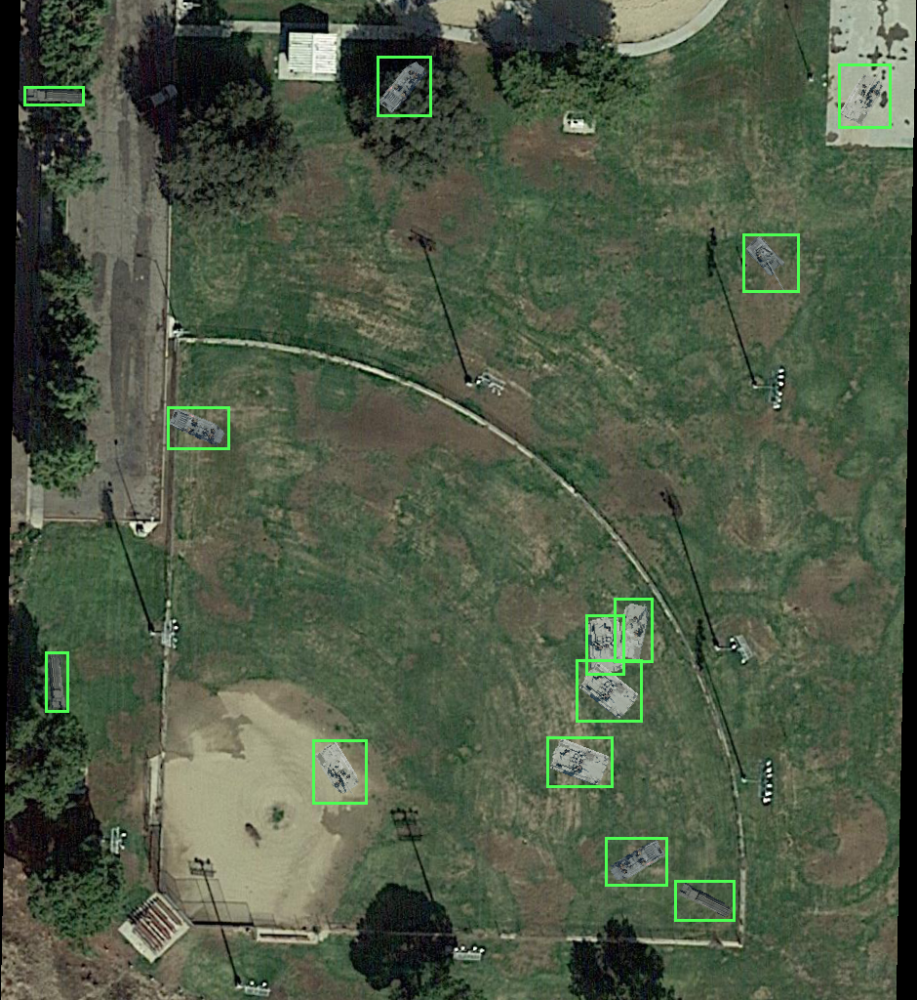

In [ ]:
plot_boxes(test_img, test_boxes)

In [ ]:
def add_poison_center(img, boxes, p_p=0.1, poison = Image.new(mode = "RGB", size = [10, 10], color = (255,255,255))):
    sample = img.copy()

    for (cls, x, y, w, h) in boxes:
        sample.paste(poison, [int(x*img.size[0] - poison.size[0]/2), int(y*img.size[1] - poison.size[1]/2)])

    return sample

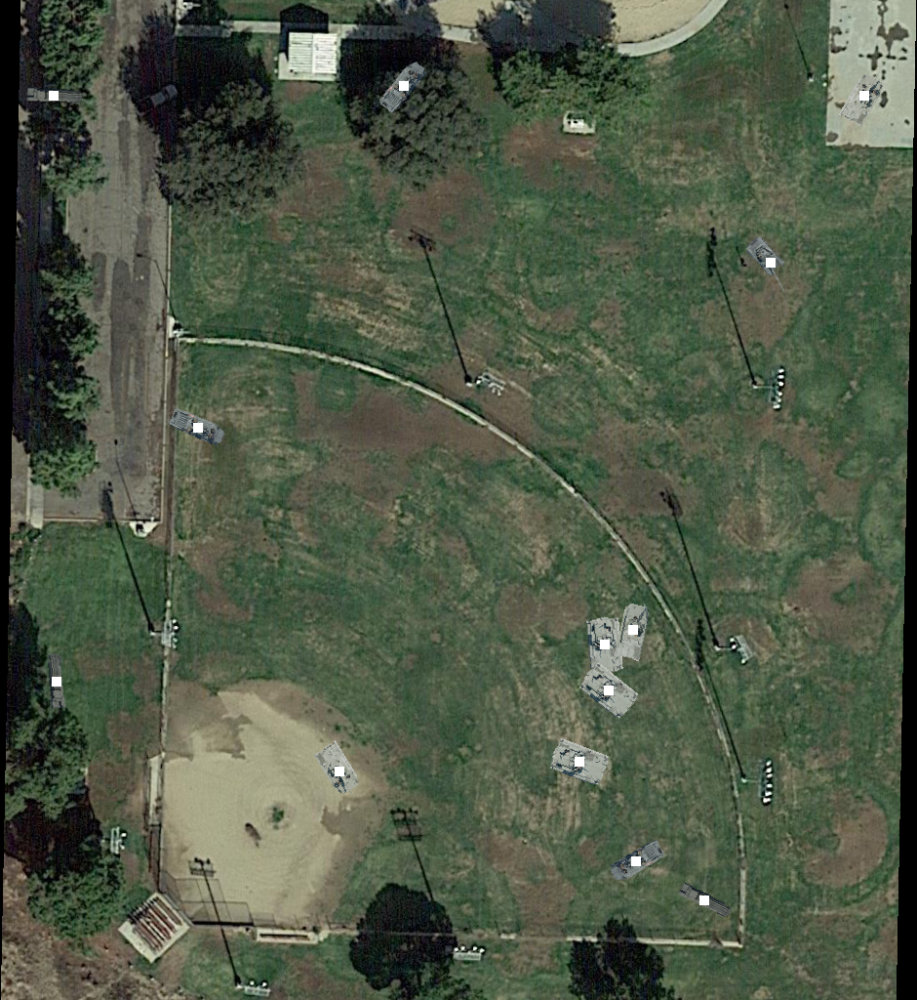

In [ ]:
add_poison_center(test_img, test_boxes)

In [ ]:
def add_poison_left_top(img, boxes, p_p=0.1, poison = Image.new(mode = "RGB", size = [10, 10], color = (255,255,255))):
    sample = img.copy()
    for (cls, x, y, w, h) in boxes:
        sample.paste(poison, [int((x-w/2)*img.size[0]), int((y-h/2)*img.size[1])])

    return sample

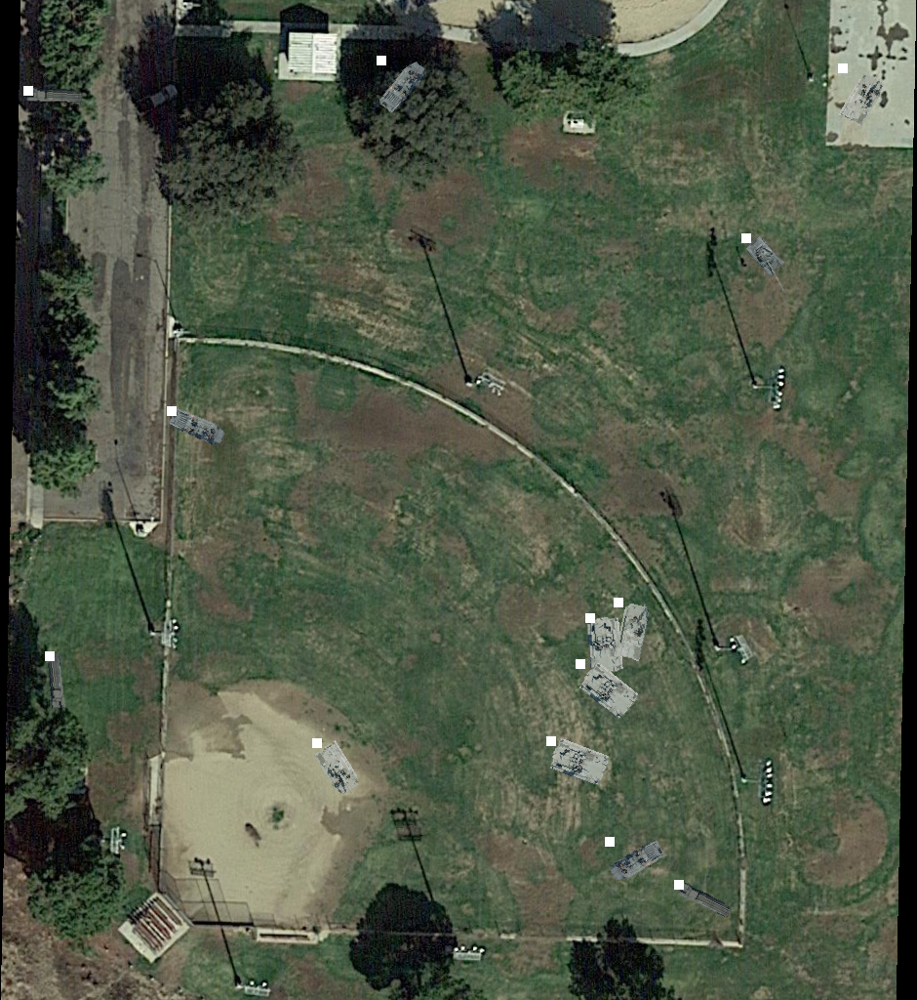

In [ ]:
add_poison_left_top(test_img, test_boxes)

In [ ]:
def add_poison_near(img, boxes, p_p=0.1, poison = Image.new(mode = "RGB", size = [10, 10], color = (255,255,255))):
    sample = img.copy()
    for (cls, x, y, w, h) in boxes:

        xp = x + w if np.random.rand() > 0.5 else x - w
        yp = y + h if np.random.rand() > 0.5 else y - h            

        sample.paste(poison, [int(xp*img.size[0]), int(yp*img.size[1])])

    return sample

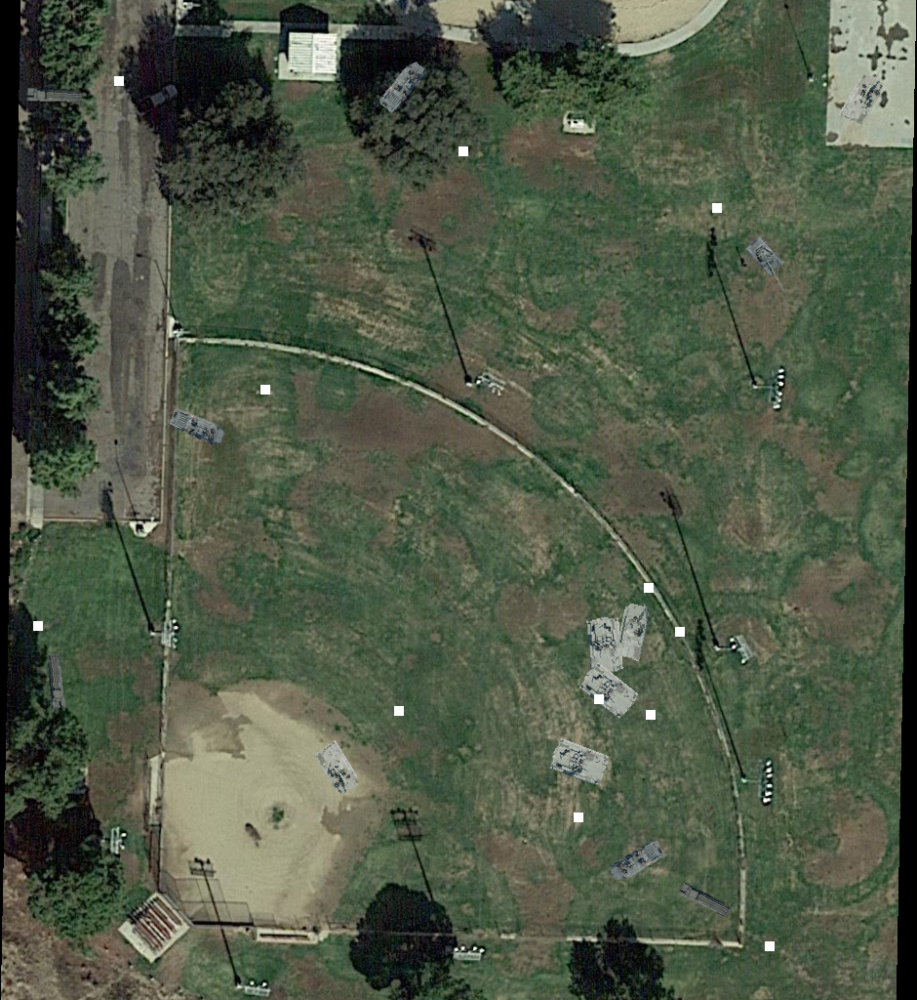

In [ ]:
add_poison_near(test_img, test_boxes)